 # Paris Neighborhood Business Analysis : How to find an optimal to optimal place to open a French restaurant business in Paris?

## Table of contents

* [Introduction: Business Problem](#introduction)

* [Data](#data)

* [Methodology](#methodology)

* [Part I : Paris neighborhoods analysis](#part1)

 * [Part II : Searching an Optimal place for a new french restaurant business in Paris](#part2)
 
 * [Conclusion](#conclusion)

## Introduction: Business Problem <a name="introduction"></a>

Identifying the best location to set up a business in a city or country is one of the crucial steps in an investment process. To take **advantage of positive externalities and agglomeration effects**, this search must be conducted with regard to the location of other activities. Indeed, considering the activities of other sectors would allow to detect on the one hand, the main drivers of the business that we want to implement and on the other hand, to be better located in relation to competing businesses.


The purpose of this project is to **find the optimal location for a food service company in Paris**. Thus, we analyze different location possibilities in the city of Paris. In other words, the aim is to recommend to stakeholders the best location for their business. We will focus our analysis on the restaurant sector and more specifically on the establishment of a “French restaurant” in Paris. This study can also be extended to other activities.
This subject is particularly interesting because the firm must make a trade-off between competition and the existence of possible positive externalities that would result from agglomeration effects, to achieve the number of customers needed to maximize profit.

In order to carry out this study, we will focus on the **clustering of neighborhoods by activities and the analysis of nearby restaurants**.


## Data <a name="data"></a>

Given the problem and the context, we need to identify the activities clustering in Paris’ neighborhoods, to determine the number and distance of French restaurant in neighborhood and the distance between the neighborhood and city center.
To do so, we use three sources of data that present:
-	The list of neighborhoods in Paris with their geographical coordinates: we load these data in **France data portail [data.gov.fr](https://www.data.gouv.fr/fr/)**.
-	The number of restaurants, their location and their type in every neighborhood will be obtained by using **Foursquare API**
-	The restaurant addresses are obtained by using **Google Map API geocoding**

## Methodology <a name="methodology"></a>

This project will be consisting in two part.<p>

In the first part, we will **analyze the business cluster in Paris’ neighborhood**. This clustering has the benefit of helping to determine the activities in the different neighborhoods that could have a driving effect on a restaurant business in general and French restaurant in particular. The result of this clustering will lead to **identify the place where opening a French restaurant could be interesting**.
    
In the second part of this work, we will **detect all the location of each restaurant in a given radius (10km) from the center of Paris**. Based on **Foursquare categorization**, we will also identify French restaurant.

After collecting different restaurant, we will **calculate the density of these restaurants** across different areas in Paris. We use **heatmaps** to determine the area close to the center of Paris with a few numbers of French restaurant. We rely on the result that we find in first part of our analysis to choose the area that have a driving effect on restaurant business with few numbers of restaurant. After the area’s identification, we **create cluster of location** that will give some indication of the venues where opening a French restaurant will be optimal. To do this, we will define some constraints relative to the **maximum number of restaurants** that should not be exceeded and the **minimum radius** in which we could not find a French restaurant. We will map these locations given the optimal area identified and print the clusters center addresses.




Before starting to explore data and analysis, let's import the necessary library that we will need


In [1]:
import requests
import pandas as pd
import numpy as np
import random
import html5lib
import time
import geocoder
from geopy.geocoders import Nominatim 
import folium
from folium import plugins
from folium.plugins import HeatMap
from pandas.io.json import json_normalize
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [2]:
import ssl

try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    # Legacy Python that doesn't verify HTTPS certificates by default
    pass
else:
    # Handle target environment that doesn't support HTTPS verification
    ssl._create_default_https_context = _create_unverified_https_context

In [3]:
#we ignore the warnings messages
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

# Part I : Paris neighborhoods analysis <a name="part1"></a>

In paris, there are 20 borough and 80 neighborhoods. In order to  segmente these neighborhoods en analyse them, we need a dataset that containt their geographical coordinates. In other word, we need a dataset that contains all the 20 boroughs and their neighborhoods, and for each neighborhoods, we need to the get their latitude and longitude coordinates.

We can read these data on France data portail [data.gov.fr](data.gouv.fr/).

In [4]:
Geospatial_Coordinates = "https://opendata.paris.fr/explore/dataset/quartier_paris/download?format=csv&timezone=Europe/Berlin&use_labels_for_header=false"


We use pandas to struture and read the dataset.

In [5]:
geodata = pd.read_csv(Geospatial_Coordinates, sep =";")
df_geo = pd.DataFrame(geodata)
df_geo.columns

Index(['n_sq_qu', 'c_qu', 'c_quinsee', 'l_qu', 'c_ar', 'n_sq_ar', 'perimetre',
       'surface', 'geom_x_y', 'geom', 'st_area_shape', 'st_perimeter_shape'],
      dtype='object')


Let's clean the dataset

In [6]:
df_geo[['Latitude', 'Longitude']] = df_geo['geom_x_y'].str.split(',', 1, expand=True).astype(float)
geo_paris = df_geo[["c_ar", "l_qu",'Latitude', 'Longitude']]
geo_paris.rename(columns={'c_ar':"arr_number", 'l_qu': 'Neighborhood','Latitude':'Latitude', 'Longitude':'Longitude'}, inplace=True)
geo_paris.head()

,arr_number,Neighborhood,Latitude,Longitude
0,3,Arts-et-Métiers,48.866470,2.357083
1,20,Père-Lachaise,48.863719,2.395273
2,18,La Chapelle,48.894012,2.364387
3,2,Gaillon,48.869307,2.333432
4,6,Monnaie,48.854384,2.340035


In [7]:
df_geo[['Latitude', 'Longitude']] = df_geo['geom_x_y'].str.split(',', 1, expand=True).astype(float)
df_geo.dtypes

n_sq_qu                 int64
c_qu                    int64
c_quinsee               int64
l_qu                   object
c_ar                    int64
n_sq_ar                 int64
perimetre             float64
surface               float64
geom_x_y               object
geom                   object
st_area_shape         float64
st_perimeter_shape    float64
Latitude              float64
Longitude             float64
dtype: object

We use the same portail to get all the name of borough and their Postal Code.

In [8]:
code = 'https://www.data.gouv.fr/fr/datasets/r/0d3553c6-45c0-4b16-82be-5ef314437d3e'

In [9]:
paris_post=pd.read_csv(code, sep=";", usecols=[1, 2, 3, 4])
paris_post.rename(columns={'c_ar':'arr_number', 'c_arinsee': 'PostalCode','l_ar':'arrondissement', 'l_aroff':'Borough'}, inplace=True)
paris_post

,arr_number,PostalCode,arrondissement,Borough
0,1,75101,1er Ardt,Louvre
1,5,75105,5ème Ardt,Panthéon
2,19,75119,19ème Ardt,Buttes-Chaumont
3,6,75106,6ème Ardt,Luxembourg
4,12,75112,12ème Ardt,Reuilly
5,13,75113,13ème Ardt,Gobelins
6,14,75114,14ème Ardt,Observatoire
7,16,75116,16ème Ardt,Passy
8,2,75102,2ème Ardt,Bourse
9,10,75110,10ème Ardt,Entrepôt


In [10]:
paris_data = pd.merge(paris_post,geo_paris, on= 'arr_number')
paris_data = paris_data[['PostalCode', 'Borough', 'Neighborhood', 'Latitude', 'Longitude']]
paris_data.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,75101,Louvre,Palais-Royal,48.864660,2.336309
1,75101,Louvre,Place-Vendôme,48.867019,2.328582
2,75101,Louvre,Saint-Germain-l'Auxerrois,48.860650,2.334910
3,75101,Louvre,Halles,48.862289,2.344899
4,75105,Panthéon,Val-de-Grace,48.841684,2.343861


Let's get the geographical coordinates of Paris.

In [11]:
address = 'Paris, FR'

geolocator = Nominatim(user_agent="paris_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Paris are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Paris are 48.8588897, 2.3200410217200766.


In [12]:
paris_center=[latitude, longitude]
paris_center

[48.8588897, 2.3200410217200766]

We create a map to visualize the Paris' neighborhoods.

In [13]:
# create map of Paris using latitude and longitude values
map_paris = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
for lat, lng, borough, neighborhood in zip(paris_data['Latitude'], paris_data['Longitude'], paris_data['Borough'], paris_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=20,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_paris)  
    
map_paris

Since we have all the neighborhoods, we can start using the Foursquare API to analyse them and segment them.

In [ ]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value
TOKEN = ""

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

In [15]:
neighborhood_latitude = paris_data.loc[0, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = paris_data.loc[0, 'Longitude'] # neighborhood longitude value

neighborhood_name = paris_data.loc[0, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Palais-Royal are 48.86465997810254, 2.33630891896531.


In [ ]:
LIMIT = 100

radius = 500

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET,  VERSION, neighborhood_latitude,  neighborhood_longitude, radius, LIMIT)
url

In [17]:
results = requests.get(url).json()
#results

Since we know that all the information is in items keys, we can define a fuction from Fousquare to extract the venue 

In [18]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Let's clean the json data and structure i into a pandas dataframe.

In [19]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Jardin du Palais Royal,Garden,48.864941,2.337728
1,Palais Royal,Historic Site,48.863236,2.337127
2,Sanukiya,Udon Restaurant,48.864713,2.333805
3,Nolinski,Hotel,48.865367,2.334584
4,Comédie-Française,Theater,48.863088,2.336612


In [20]:
nearby_venues.shape[0]

100

We can create a function to get a nearby venues from alle the neighborhoods in Paris

In [21]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

We apply the fucntion in our data.

In [22]:
paris_venues = getNearbyVenues(names=paris_data['Neighborhood'], latitudes=paris_data['Latitude'], longitudes=paris_data['Longitude'])

Palais-Royal
Place-Vendôme
Saint-Germain-l'Auxerrois
Halles
Val-de-Grace
Jardin-des-Plantes
Sorbonne
Saint-Victor
Pont-de-Flandre
Combat
Villette
Amérique
Monnaie
Odéon
Saint-Germain-des-Prés
Notre-Dame-des-Champs
Bercy
Picpus
Quinze-Vingts
Bel-Air
Salpêtrière
Gare
Maison-Blanche
Croulebarbe
Plaisance
Parc-de-Montsouris
Montparnasse
Petit-Montrouge
Porte-Dauphine
Chaillot
Auteuil
Muette
Gaillon
Mail
Bonne-Nouvelle
Vivienne
Hôpital-Saint-Louis
Porte-Saint-Denis
Porte-Saint-Martin
Saint-Vincent-de-Paul
Batignolles
Plaine de Monceaux
Ternes
Epinettes
Invalides
Saint-Thomas-d'Aquin
Ecole-Militaire
Gros-Caillou
La Chapelle
Clignancourt
Goutte-d'Or
Grandes-Carrières
Rochechouart
Chaussée-d'Antin
Faubourg-Montmartre
Saint-Georges
Arts-et-Métiers
Enfants-Rouges
Sainte-Avoie
Archives
Champs-Elysées
Madeleine
Faubourg-du-Roule
Europe
Necker
Grenelle
Saint-Lambert
Javel
Sainte-Marguerite
Roquette
Saint-Ambroise
Folie-Méricourt
Arsenal
Saint-Gervais
Notre-Dame
Saint-Merri
Père-Lachaise
Belleville


We can check the size of of the resulting dataframe

In [23]:
print(paris_venues.shape)
paris_venues.head()

(5385, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Palais-Royal,48.86466,2.336309,Jardin du Palais Royal,48.864941,2.337728,Garden
1,Palais-Royal,48.86466,2.336309,Palais Royal,48.863236,2.337127,Historic Site
2,Palais-Royal,48.86466,2.336309,Sanukiya,48.864713,2.333805,Udon Restaurant
3,Palais-Royal,48.86466,2.336309,Nolinski,48.865367,2.334584,Hotel
4,Palais-Royal,48.86466,2.336309,Comédie-Française,48.863088,2.336612,Theater


In [24]:
paris_venues.loc[paris_venues["Venue Category"]=='Plaza']

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
25,Palais-Royal,48.864660,2.336309,Place du Palais Royal,48.862523,2.336688,Plaza
39,Palais-Royal,48.864660,2.336309,Place André Malraux,48.863593,2.335196,Plaza
50,Palais-Royal,48.864660,2.336309,Place des Pyramides,48.863924,2.332224,Plaza
74,Palais-Royal,48.864660,2.336309,Place des Victoires,48.865759,2.341219,Plaza
101,Place-Vendôme,48.867019,2.328582,Place Vendôme,48.867376,2.329348,Plaza
...,...,...,...,...,...,...,...
5197,Saint-Merri,48.858521,2.351667,Place du Châtelet,48.857714,2.347504,Plaza
5257,Père-Lachaise,48.863719,2.395273,Place Gambetta,48.864915,2.398482,Plaza
5262,Père-Lachaise,48.863719,2.395273,Place Martin Nadaud,48.864983,2.394750,Plaza
5358,Charonne,48.854760,2.407430,Porte de Montreuil,48.854614,2.409557,Plaza


Let's count the number of venues that we obtained for each neighborhood.

In [25]:
paris_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Amérique,13,13,13,13,13,13
Archives,100,100,100,100,100,100
Arsenal,68,68,68,68,68,68
Arts-et-Métiers,100,100,100,100,100,100
Auteuil,17,17,17,17,17,17
...,...,...,...,...,...,...
Sorbonne,100,100,100,100,100,100
Ternes,66,66,66,66,66,66
Val-de-Grace,47,47,47,47,47,47


We can count the number of unique categories from all the venues we get

In [26]:
print('There are {} uniques categories.'.format(len(paris_venues['Venue Category'].unique())))

There are 299 uniques categories.


In [27]:
# one hot encoding
paris_onehot = pd.get_dummies(paris_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
paris_onehot['Neighborhood'] = paris_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [paris_onehot.columns[-1]] + list(paris_onehot.columns[:-1])
paris_onehot = paris_onehot[fixed_columns]

paris_onehot.head()

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Alsatian Restaurant,American Restaurant,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Udon Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Palais-Royal,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Palais-Royal,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Palais-Royal,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,Palais-Royal,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Palais-Royal,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [28]:
paris_onehot.shape

(5385, 300)

We group the rows by neigborhoods and by taking the mean of frequency of occurence of each category

In [29]:
paris_grouped = paris_onehot.groupby('Neighborhood').mean().reset_index()
paris_grouped

,Neighborhood,Accessories Store,Afghan Restaurant,African Restaurant,Airport Lounge,Alsatian Restaurant,American Restaurant,Arcade,Arepa Restaurant,Argentinian Restaurant,...,Udon Restaurant,Vegetarian / Vegan Restaurant,Venezuelan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
0,Amérique,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.000000,...,0.00,0.000000,0.0,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0
1,Archives,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.000000,...,0.00,0.000000,0.0,0.000000,0.020000,0.00,0.00,0.0,0.0,0.0
2,Arsenal,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.014706,...,0.00,0.029412,0.0,0.000000,0.014706,0.00,0.00,0.0,0.0,0.0
3,Arts-et-Métiers,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.010000,...,0.00,0.020000,0.0,0.030000,0.030000,0.01,0.00,0.0,0.0,0.0
4,Auteuil,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.000000,...,0.00,0.000000,0.0,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,Sorbonne,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.000000,...,0.00,0.000000,0.0,0.010000,0.020000,0.00,0.00,0.0,0.0,0.0
76,Ternes,0.0,0.0,0.0,0.0,0.0,0.015152,0.00,0.0,0.000000,...,0.00,0.000000,0.0,0.015152,0.030303,0.00,0.00,0.0,0.0,0.0
77,Val-de-Grace,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.0,0.000000,...,0.00,0.000000,0.0,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0
78,Villette,0.0,0.0,0.0,0.0,0.0,0.016667,0.00,0.0,0.000000,...,0.00,0.000000,0.0,0.000000,0.000000,0.00,0.00,0.0,0.0,0.0


In [30]:
french_restaurant = paris_grouped[['Neighborhood', 'French Restaurant']].sort_values('French Restaurant', ascending=False)
french_restaurant.tail(40)

,Neighborhood,French Restaurant
55,Porte-Saint-Denis,0.120879
79,Vivienne,0.120000
23,Folie-Méricourt,0.120000
68,Saint-Merri,0.120000
1,Archives,0.120000
66,Saint-Gervais,0.120000
60,Roquette,0.119565
74,Salpêtrière,0.111111
17,Ecole-Militaire,0.111111
35,La Chapelle,0.111111


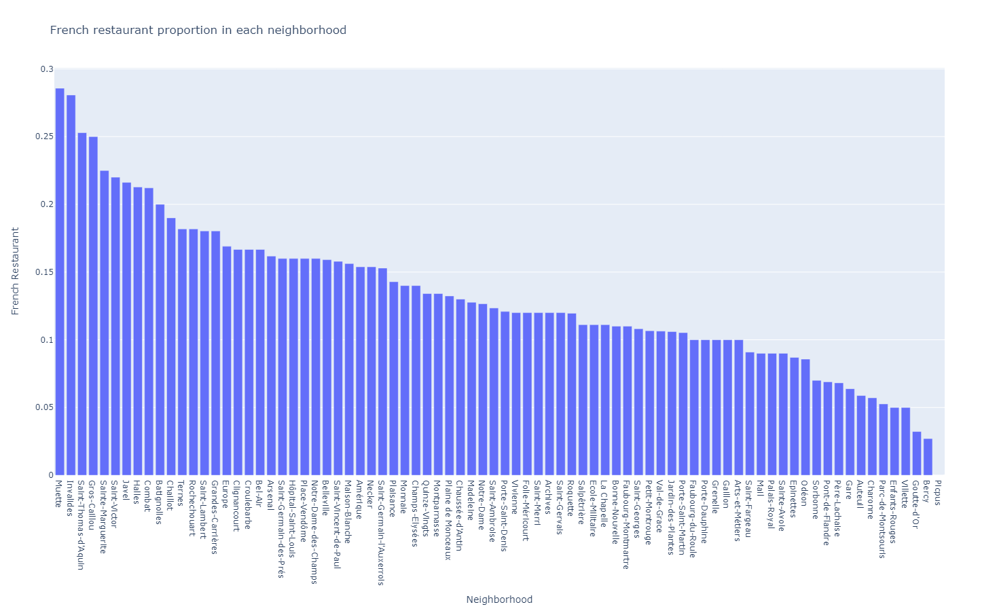

In [31]:
fig = px.bar(french_restaurant, x='Neighborhood', y='French Restaurant', title='French restaurant proportion in each neighborhood', height=900) 
fig.show()

We print for each neighborhoods the top 5 common venues.

In [33]:
num_top_venues = 5

for hood in paris_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = paris_grouped[paris_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Amérique----
               venue  freq
0        Supermarket  0.15
1  French Restaurant  0.15
2              Plaza  0.15
3         Street Art  0.08
4               Pool  0.08


----Archives----
               venue  freq
0  French Restaurant  0.12
1     Clothing Store  0.09
2              Hotel  0.04
3          Bookstore  0.04
4           Tea Room  0.04


----Arsenal----
               venue  freq
0  French Restaurant  0.16
1              Hotel  0.07
2               Park  0.04
3              Plaza  0.04
4   Tapas Restaurant  0.04


----Arts-et-Métiers----
                venue  freq
0   French Restaurant  0.10
1               Hotel  0.06
2  Italian Restaurant  0.05
3        Cocktail Bar  0.05
4  Chinese Restaurant  0.04


----Auteuil----
               venue  freq
0       Tennis Court  0.29
1            Stadium  0.12
2             Garden  0.12
3  French Restaurant  0.06
4             Office  0.06


----Batignolles----
                venue  freq
0   French Restaurant  0.20
1       

As we can see the french restaurant the French restaurant is in the top 5 common venues of the majority of the neighborhoods. Only in **Auteuil, Charonne, Goutte-d'Or, La Chapelle, Picpus, Porte-Dauphine et Saint-Fargeau** that the French restaurant is not in top 5 of common venues. 


Also, in some neighborhoods like **Bercy, Archives, Bonne-Nouvelle, Gaillon, Gare, Mail, Porte-Saint-Martin, Père-Lachaise, Villette and Vivienne**, if the French restaurant is part of the top 5 common venues, their population is low. The existence of activities that have a driving effect on the French restaurant can be an opportunity to open a French restaurant. 

Is their neighborhoods have some positive externalities on French restaurant business? We need to segment the neighborhoods to find which neighborhoods have some positive externalities on French restaurant business.

We write a function to sort the venues in descending order

In [34]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Let's put these sorting venues into a pandas dataframe.

In [35]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = paris_grouped['Neighborhood']

for ind in np.arange(paris_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(paris_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Amérique,Supermarket,French Restaurant,Plaza,Street Art,Pool,Park,Bistro,Café,Bed & Breakfast,Smoke Shop
1,Archives,French Restaurant,Clothing Store,Hotel,Bookstore,Tea Room,Plaza,Bar,Cocktail Bar,Coffee Shop,Historic Site
2,Arsenal,French Restaurant,Hotel,Park,Plaza,Tapas Restaurant,Pedestrian Plaza,Gastropub,Historic Site,Vegetarian / Vegan Restaurant,Cocktail Bar
3,Arts-et-Métiers,French Restaurant,Hotel,Italian Restaurant,Cocktail Bar,Chinese Restaurant,Bakery,Restaurant,Wine Bar,Vietnamese Restaurant,Coffee Shop
4,Auteuil,Tennis Court,Stadium,Garden,French Restaurant,Office,Sporting Goods Shop,Racecourse,Botanical Garden,Outdoors & Recreation,Plaza


We run k-means to cluster the neighborhoods into 5 clusters.

In [36]:
# set number of clusters
kclusters = 5

paris_grouped_clustering = paris_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(paris_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([3, 1, 3, 1, 4, 3, 3, 3, 1, 1])

We create a dataframe that include the clusters as well as the top 10 venues for each neighborhood.

In [37]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

paris_merged = paris_data

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
paris_merged = paris_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

paris_merged.head() # check the last columns!

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,75101,Louvre,Palais-Royal,48.864660,2.336309,1,Japanese Restaurant,French Restaurant,Ramen Restaurant,Café,Coffee Shop,Hotel,Plaza,Korean Restaurant,Wine Bar,Bistro
1,75101,Louvre,Place-Vendôme,48.867019,2.328582,0,French Restaurant,Hotel,Jewelry Store,Boutique,Japanese Restaurant,Hotel Bar,Pastry Shop,Restaurant,Coffee Shop,Clothing Store
2,75101,Louvre,Saint-Germain-l'Auxerrois,48.860650,2.334910,0,French Restaurant,Hotel,Café,Coffee Shop,Exhibit,Plaza,Historic Site,Art Museum,Japanese Restaurant,Brasserie
3,75101,Louvre,Halles,48.862289,2.344899,3,French Restaurant,Hotel,Furniture / Home Store,Café,Coffee Shop,Italian Restaurant,Bar,Bakery,Burger Joint,Pizza Place
4,75105,Panthéon,Val-de-Grace,48.841684,2.343861,1,French Restaurant,Hotel,Pizza Place,Bakery,Bistro,Creperie,Beer Bar,Lebanese Restaurant,Café,Burger Joint


We can visualize the resulting cluster

In [38]:
# create map
paris_clusters_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(paris_merged['Latitude'], paris_merged['Longitude'], paris_merged['Neighborhood'], paris_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=15,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(paris_clusters_map)
       
paris_clusters_map

We can examine each cluster and determine the characteristics of the different clusters. The characteristics of the clusters will allow us to determine if a neighborhood has activities that have driving effects on a French restaurant.

Cluster 1

In [39]:
paris_merged.loc[paris_merged['Cluster Labels'] == 0, paris_merged.columns[[1,2] + list(range(5, paris_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Louvre,Place-Vendôme,0,French Restaurant,Hotel,Jewelry Store,Boutique,Japanese Restaurant,Hotel Bar,Pastry Shop,Restaurant,Coffee Shop,Clothing Store
2,Louvre,Saint-Germain-l'Auxerrois,0,French Restaurant,Hotel,Café,Coffee Shop,Exhibit,Plaza,Historic Site,Art Museum,Japanese Restaurant,Brasserie
14,Luxembourg,Saint-Germain-des-Prés,0,French Restaurant,Hotel,Italian Restaurant,Wine Bar,Sandwich Place,Cocktail Bar,Café,Bookstore,Japanese Restaurant,Plaza
15,Luxembourg,Notre-Dame-des-Champs,0,French Restaurant,Hotel,Bakery,Bistro,Japanese Restaurant,Italian Restaurant,Steakhouse,Chocolate Shop,Cosmetics Shop,Tea Room
20,Gobelins,Salpêtrière,0,Hotel,Indian Restaurant,French Restaurant,Sushi Restaurant,Bar,Gym / Fitness Center,Chinese Restaurant,Corsican Restaurant,Pizza Place,Sandwich Place
24,Observatoire,Plaisance,0,Hotel,French Restaurant,Bistro,Korean Restaurant,Café,Grocery Store,Bar,Bakery,Japanese Restaurant,Thai Restaurant
25,Observatoire,Parc-de-Montsouris,0,Italian Restaurant,Hotel,Japanese Restaurant,Chinese Restaurant,Bistro,Theater,Lebanese Restaurant,Diner,Kebab Restaurant,Park
26,Observatoire,Montparnasse,0,French Restaurant,Hotel,Bistro,Italian Restaurant,Bar,Café,Bakery,Sushi Restaurant,Pizza Place,Restaurant
27,Observatoire,Petit-Montrouge,0,Hotel,French Restaurant,Italian Restaurant,Supermarket,Japanese Restaurant,Pizza Place,Plaza,Sandwich Place,Sushi Restaurant,Discount Store
29,Passy,Chaillot,0,Hotel,French Restaurant,Italian Restaurant,Bakery,Plaza,Café,Japanese Restaurant,Chinese Restaurant,Indian Restaurant,Salad Place


This cluster is leisure place. In this sense the business related to leisure could make this center of attraction.

Cluster 2

In [40]:
paris_merged.loc[paris_merged['Cluster Labels'] == 1, paris_merged.columns[[1,2] + list(range(5, paris_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Louvre,Palais-Royal,1,Japanese Restaurant,French Restaurant,Ramen Restaurant,Café,Coffee Shop,Hotel,Plaza,Korean Restaurant,Wine Bar,Bistro
4,Panthéon,Val-de-Grace,1,French Restaurant,Hotel,Pizza Place,Bakery,Bistro,Creperie,Beer Bar,Lebanese Restaurant,Café,Burger Joint
5,Panthéon,Jardin-des-Plantes,1,French Restaurant,Science Museum,Hotel,Garden,Zoo Exhibit,Coffee Shop,Museum,Moroccan Restaurant,Plaza,Botanical Garden
6,Panthéon,Sorbonne,1,Hotel,French Restaurant,Bookstore,Café,Indie Movie Theater,Plaza,Ice Cream Shop,Pastry Shop,Coffee Shop,Bakery
8,Buttes-Chaumont,Pont-de-Flandre,1,Hotel,French Restaurant,Asian Restaurant,Café,Supermarket,Restaurant,Rock Club,Movie Theater,Tram Station,Boat or Ferry
10,Buttes-Chaumont,Villette,1,Hotel,Bar,Café,French Restaurant,Supermarket,Asian Restaurant,Fast Food Restaurant,Bistro,Multiplex,Food Truck
12,Luxembourg,Monnaie,1,French Restaurant,Wine Bar,Hotel,Cocktail Bar,Plaza,Bookstore,Pub,Seafood Restaurant,Bar,Creperie
13,Luxembourg,Odéon,1,Hotel,French Restaurant,Café,Garden,Bakery,Sandwich Place,Wine Bar,Clothing Store,Cocktail Bar,Tea Room
16,Reuilly,Bercy,1,Hotel,Italian Restaurant,Supermarket,French Restaurant,Breakfast Spot,Japanese Restaurant,Burger Joint,Bar,Bakery,Museum
18,Reuilly,Quinze-Vingts,1,French Restaurant,Coffee Shop,Hotel,Sandwich Place,Bakery,Bar,Japanese Restaurant,Italian Restaurant,Farmers Market,Burger Joint


This cluster combine a business center and some tourist activities. In these neighborhoods, the a french restaurant could be very interesting. In fact, the french restaurant should attract the tourist since the French cuisine has a great reputaion around the world.

In this cluster, some banking and financial services could also be interesting.

Cluster 3

In [41]:
paris_merged.loc[paris_merged['Cluster Labels'] == 2, paris_merged.columns[[1,2] + list(range(5, paris_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
17,Reuilly,Picpus,2,Pastry Shop,Locksmith,Pharmacy,Pet Store,Pet Café,Peruvian Restaurant,Perfume Shop,Performing Arts Venue,Pedestrian Plaza,Accessories Store


The activities in the third cluster are mainly leisure activities. The leisures activities such as gaming center or entertainment business could be relevant.

Cluster 4

In [42]:
paris_merged.loc[paris_merged['Cluster Labels'] == 3, paris_merged.columns[[1,2] + list(range(5, paris_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,Louvre,Halles,3,French Restaurant,Hotel,Furniture / Home Store,Café,Coffee Shop,Italian Restaurant,Bar,Bakery,Burger Joint,Pizza Place
7,Panthéon,Saint-Victor,3,French Restaurant,Bakery,Hotel,Bistro,Museum,Wine Bar,Pub,Park,Café,Italian Restaurant
9,Buttes-Chaumont,Combat,3,French Restaurant,Restaurant,Park,Italian Restaurant,Coffee Shop,Hostel,Moroccan Restaurant,Tennis Stadium,Thai Restaurant,Beer Garden
11,Buttes-Chaumont,Amérique,3,Supermarket,French Restaurant,Plaza,Street Art,Pool,Park,Bistro,Café,Bed & Breakfast,Smoke Shop
19,Reuilly,Bel-Air,3,Café,Sports Club,Recreation Center,Playground,Plaza,French Restaurant,Accessories Store,Peruvian Restaurant,Perfume Shop,Performing Arts Venue
22,Gobelins,Maison-Blanche,3,French Restaurant,Bakery,Bus Stop,Supermarket,Plaza,Bed & Breakfast,Bistro,Beer Store,Hotel,Chinese Restaurant
23,Gobelins,Croulebarbe,3,French Restaurant,Sushi Restaurant,Hotel,Sandwich Place,Multiplex,Italian Restaurant,Bar,Burger Joint,Bakery,Café
28,Passy,Porte-Dauphine,3,Grocery Store,Café,French Restaurant,Tennis Court,Pizza Place,Gym / Fitness Center,Gym Pool,Train Station,Plaza,Performing Arts Venue
31,Passy,Muette,3,French Restaurant,Diner,Pool,Gym / Fitness Center,Boat or Ferry,Lake,Outdoors & Recreation,Paper / Office Supplies Store,Outdoor Sculpture,Park
36,Entrepôt,Hôpital-Saint-Louis,3,French Restaurant,Bar,Wine Bar,Café,Coffee Shop,Thai Restaurant,Bistro,Asian Restaurant,Supermarket,Diner


This cluster has a great attraction at night. The business in this cluster have a positve externalities on a restaurant business in general. Indeed, in this cluster, the night attraction show show that there could be a great demand of restaurant business for diner.

However, since we can observe, the French restaurant is the most common business in this cluster. So, at first sight, opening a French restaurant in this cluster does not seems interesting because of their great frequency. Because of this positive externalities on a restaurant business, we could find an optimal place to open a French restaurant by analysing their density.

We can confirm also that opening an exotic restaurant could be an interesting business.

Cluster 5

In [43]:
paris_merged.loc[paris_merged['Cluster Labels'] == 4, paris_merged.columns[[1,2] + list(range(5, paris_merged.shape[1]))]]

,Borough,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
30,Passy,Auteuil,4,Tennis Court,Stadium,Garden,French Restaurant,Office,Sporting Goods Shop,Racecourse,Botanical Garden,Outdoors & Recreation,Plaza


This last cluster is charaterized by shopping activities and cultural business. These activities have a positive effect on restaurant business as well as a fast food business.

Depending on the density of the French restaurants, it could be interesting to open a French restaurant in this cluster.

# Part II : Searching an Optimal place for a new french restaurant business in Paris <a name="part2"></a>

After analysis the Paris neighborhood businesses, we now look for an optimal place to open a french restaurant business according to our clustering result.

In [44]:

google_api_key = "" #We deliberately delete the key

Since our study focus on paris borough, we crate a grid of area candidadtes which is equally spaced, centered arround Paris center within and 5km radius. Our neighborhoods will beat this time defined as circular areas with a radius of 250 meters, so our neighborhood centers will be 500 meters apart.

Let us recall that the optimal location of a French restaurant is the one that is located in areas with activities that have a strong impact on the business on the one hand and on the other hand, the one that respects a certain distance with the competitors (at least the average distance between the French restaurants).

To take into account this last constraint, we define functions to compute the Cartesian coordinates in two dimensions. Then, we define a function that transforms the geographic coordinate system into a Cartesian coordinate system in meter.

We visualize the geographical coordinates on folium map.

***Functions definition***

In [45]:
#!pip install shapely
import shapely.geometry

#!pip install pyproj
import pyproj
from pyproj import Proj, transform

import math

def lonlat_to_xy(lon, lat):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    xy = pyproj.transform(proj_latlon, proj_xy, lon, lat)
    return xy[0], xy[1]

def xy_to_lonlat(x, y):
    proj_latlon = pyproj.Proj(proj='latlong',datum='WGS84')
    proj_xy = pyproj.Proj(proj="utm", zone=33, datum='WGS84')
    lonlat = pyproj.transform(proj_xy, proj_latlon, x, y)
    return lonlat[0], lonlat[1]

def calc_xy_distance(x1, y1, x2, y2):
    dx = x2 - x1
    dy = y2 - y1
    return math.sqrt(dx*dx + dy*dy)

print('Coordinate transformation check')
print('-------------------------------')
print('Paris center longitude={}, latitude={}'.format(paris_center[1], paris_center[0]))
x, y = lonlat_to_xy(paris_center[1], paris_center[0])
print('Paris center UTM X={}, Y={}'.format(x, y))
lo, la = xy_to_lonlat(x, y)
print('Paris center longitude={}, latitude={}'.format(lo, la))

Coordinate transformation check
-------------------------------
Paris center longitude=2.3200410217200766, latitude=48.8588897
Paris center UTM X=-428991.5733106546, Y=5489780.907372348
Paris center longitude=2.320041021720075, latitude=48.8588897


Grid of area candidates

In [46]:
paris_center_x, paris_center_y = lonlat_to_xy(paris_center[1], paris_center[0]) # City center in Cartesian coordinates

k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_min = paris_center_x - 5000
x_step = 500 
y_min = paris_center_y - 5000 - (int(21/k)*k*500 - 10000)/2
y_step = 500 * k 

latitudes = []
longitudes = []
distances_from_center = []
xs = []
ys = []
for i in range(0, int(21/k)):
    y = y_min + i * y_step
    x_offset = 250 if i%2==0 else 0
    for j in range(0, 21):
        x = x_min + j * x_step + x_offset
        distance_from_center = calc_xy_distance(paris_center_x, paris_center_y, x, y)
        if (distance_from_center <= 5001):
            lon, lat = xy_to_lonlat(x, y)
            latitudes.append(lat)
            longitudes.append(lon)
            distances_from_center.append(distance_from_center)
            xs.append(x)
            ys.append(y)

print(len(latitudes), 'candidates neighborhoods centers generated.')

364 candidates neighborhoods centers generated.


We can visualize our new neighborhoods within a 5 km arround Paris center.

In [47]:
map_paris = folium.Map(location=paris_center, zoom_start=13)
folium.Marker(paris_center, popup='Paris').add_to(map_paris)
for lat, lon in zip(latitudes, longitudes):
    #folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_paris)
    folium.Circle([lat, lon], radius=250, color='blue', fill=False).add_to(map_paris)
    #folium.Marker([lat, lon]).add_to(map_paris)
map_paris

Since we have the new neighborhoods candidates, we  use Google Maps API to get the addresses of theses neighborhoods.

To get those addresses, we define a function

In [48]:
def get_address(api_key, latitude, longitude, verbose=False):
    try:
        url = 'https://maps.googleapis.com/maps/api/geocode/json?key={}&latlng={},{}'.format(api_key, latitude, longitude)
        response = requests.get(url).json()
        if verbose:
            print('Google Maps API JSON result =>', response)
        results = response['results']
        address = results[0]['formatted_address']
        return address
    except:
        return None

addr = get_address(google_api_key, paris_center[0], paris_center[1])
print('Reverse geocoding check')
print('-----------------------')
print('Address of [{}, {}] is: {}'.format(paris_center[0], paris_center[1], addr))

Reverse geocoding check
-----------------------
Address of [48.8588897, 2.3200410217200766] is: 5 Rue Casimir Périer, 75007 Paris, France


We call the function for every neigborhoods in grid area candidates

In [49]:
print('Obtaining location addresses: ', end='')
addresses = []
for lat, lon in zip(latitudes, longitudes):
    address = get_address(google_api_key, lat, lon)
    if address is None:
        address = 'NO ADDRESS'
    address = address.replace(', France', '') # We don't need country part of address
    addresses.append(address)
    print(' .', end='')
print(' done.')

Obtaining location addresses:  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . done.


In [50]:
addresses[10:17]

['15 Rue du Colonel Gillon, 92120 Montrouge',
 '1 Rue de la Légion Étrangère, 75014 Paris',
 '45 Bd Jourdan, 75014 Paris',
 '20 Rue Gazan, 75014 Paris',
 '10 Pl. de Rungis, 75013 Paris',
 '22 Rue des Peupliers, 75013 Paris',
 '93A Av. de Choisy, 75013 Paris']

Let's visualize the data all data we get into a Pandas dataframe.

In [51]:

df_locations = pd.DataFrame({'Address': addresses,
                             'Latitude': latitudes,
                             'Longitude': longitudes,
                             'X': xs,
                             'Y': ys,
                             'Distance from center': distances_from_center})

df_locations.head(10)

,Address,Latitude,Longitude,X,Y,Distance from center
0,"Jean Jaurès - Stades Multisports, 92120 Montrouge",48.814857,2.310830,-430491.573311,5.485018e+06,4993.746089
1,"90 Av. de la République, 92120 Montrouge",48.815601,2.317474,-429991.573311,5.485018e+06,4866.980583
2,"16 Rue Louis Rolland, 92120 Montrouge",48.816344,2.324119,-429491.573311,5.485018e+06,4789.311015
3,"13 Rue Danton, 92120 Montrouge",48.817087,2.330764,-428991.573311,5.485018e+06,4763.139721
4,"9 D Bd Jourdan, 75014 Paris",48.817829,2.337409,-428491.573311,5.485018e+06,4789.311015
5,"1 Bd Jourdan, 75014 Paris",48.818571,2.344054,-427991.573311,5.485018e+06,4866.980583
6,"11 Av. Caffieri, 75013 Paris",48.819312,2.350700,-427491.573311,5.485018e+06,4993.746089
7,"2 Imp. Ressort, 92240 Malakoff",48.817542,2.299888,-431241.573311,5.485451e+06,4879.805324
8,"108 Av. du 12 Février 1934, 92240 Malakoff",48.818286,2.306532,-430741.573311,5.485451e+06,4670.385423
9,"49 Rue Maurice Arnoux, 92120 Montrouge",48.819029,2.313177,-430241.573311,5.485451e+06,4506.939094


In [52]:
#df_locations.drop(df_locations[df_locations['Address'].str.contains('Unnamed')].index, inplace=True)

In [53]:
df_locations.shape

(364, 6)

In [54]:
df_locations.to_pickle('./locations.pkl') 

Now, we use Foursquare API again to get information on all restaurants our define neighborhoods.

Since we are interesting in "food" related to restaurant, we need only venues that have 'restaurant' or or related name of restaurant in their category name. We need to detect also all the french restaurant venues. To do so, we create a list that containt the French restaurant category IDs.

We define some functions to get all restaurants venues and French restaurants venues.

In [55]:
# Category IDs corresponding to French restaurants were taken from Foursquare web site (https://developer.foursquare.com/docs/resources/categories):

food_category = '4d4b7105d754a06374d81259' # 'Root' category for all food-related venues

french_restaurant_categories = ['4bf58dd8d48988d10c941735','57558b36e4b065ecebd306b6','57558b36e4b065ecebd306b8',
                                 '57558b36e4b065ecebd306bc','57558b36e4b065ecebd306c5','57558b36e4b065ecebd306c0',
                                 '57558b36e4b065ecebd306ce','57558b36e4b065ecebd306d1','57558b35e4b065ecebd306ad',
                                 '57558b36e4b065ecebd306d4','57558b36e4b065ecebd306d7','57558b36e4b065ecebd306da',
                                 '57558b36e4b065ecebd306ba', '57558b36e4b065ecebd306b0', '57558b36e4b065ecebd306cb',
                                 '57558b36e4b065ecebd306b4', '57558b36e4b065ecebd306b2']

def is_restaurant(categories, specific_filter=None):
    restaurant_words = ['restaurant', 'diner', 'taverna', 'steakhouse']
    restaurant = False
    specific = False
    for c in categories:
        category_name = c[0].lower()
        category_id = c[1]
        for r in restaurant_words:
            if r in category_name:
                restaurant = True
        if 'fast food' in category_name:
            restaurant = False
        if not(specific_filter is None) and (category_id in specific_filter):
            specific = True
            restaurant = True
    return restaurant, specific

def get_categories(categories):
    return [(cat['name'], cat['id']) for cat in categories]

def format_address(location):
    address = ', '.join(location['formattedAddress'])
    address = address.replace(', France', '')
    return address

def get_venues_near_location(lat, lon, category, client_id, client_secret, radius=500, limit=100):
    version = '20180724'
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
        client_id, client_secret, version, lat, lon, category, radius, limit)
    try:
        results = requests.get(url).json()['response']['groups'][0]['items']
        venues = [(item['venue']['id'],
                   item['venue']['name'],
                   get_categories(item['venue']['categories']),
                   (item['venue']['location']['lat'], item['venue']['location']['lng']),
                   format_address(item['venue']['location']),
                   item['venue']['location']['distance']) for item in results]        
    except:
        venues = []
    return venues

In [56]:
# Let's now go over our neighborhood locations and get nearby restaurants; we'll also maintain a dictionary of all found restaurants and all found french restaurants

import pickle

def get_restaurants(lats, lons):
    restaurants = {}
    french_restaurants = {}
    location_restaurants = []

    print('Obtaining venues around candidate locations:', end='')
    for lat, lon in zip(lats, lons):
        # Using radius=350 to meke sure we have overlaps/full coverage so we don't miss any restaurant (we're using dictionaries to remove any duplicates resulting from area overlaps)
        venues = get_venues_near_location(lat, lon, food_category, CLIENT_ID, CLIENT_SECRET, radius=500, limit=100)
        area_restaurants = []
        for venue in venues:
            venue_id = venue[0]
            venue_name = venue[1]
            venue_categories = venue[2]
            venue_latlon = venue[3]
            venue_address = venue[4]
            venue_distance = venue[5]
            is_res, is_french = is_restaurant(venue_categories, specific_filter=french_restaurant_categories)
            if is_res:
                x, y = lonlat_to_xy(venue_latlon[1], venue_latlon[0])
                restaurant = (venue_id, venue_name, venue_latlon[0], venue_latlon[1], venue_address, venue_distance, is_french, x, y)
                if venue_distance<=300:
                    area_restaurants.append(restaurant)
                restaurants[venue_id] = restaurant
                if is_french:
                    french_restaurants[venue_id] = restaurant
        location_restaurants.append(area_restaurants)
        print(' .', end='')
    print(' done.')
    return restaurants, french_restaurants, location_restaurants

# Try to load from local file system in case we did this before
restaurants = {}
french_restaurants = {}
location_restaurants = []
loaded = False
try:
    with open('restaurants_350.pkl', 'rb') as f:
        restaurants = pickle.load(f)
    with open('french_restaurants_350.pkl', 'rb') as f:
        french_restaurants = pickle.load(f)
    with open('location_restaurants_350.pkl', 'rb') as f:
        location_restaurants = pickle.load(f)
    print('Restaurant data loaded.')
    loaded = True
except:
    pass

# If load failed use the Foursquare API to get the data
if not loaded:
    restaurants, french_restaurants, location_restaurants = get_restaurants(latitudes, longitudes)
    
    # Let's persists this in local file system
    with open('restaurants_350.pkl', 'wb') as f:
        pickle.dump(restaurants, f)
    with open('french_restaurants_350.pkl', 'wb') as f:
        pickle.dump(french_restaurants, f)
    with open('location_restaurants_350.pkl', 'wb') as f:
        pickle.dump(location_restaurants, f)
        

Restaurant data loaded.


In [57]:


print('Total number of restaurants:', len(restaurants))
print('Total number of French restaurants:', len(french_restaurants))
print('Percentage of French restaurants: {:.2f}%'.format(len(french_restaurants) / len(restaurants) * 100))
print('Average number of restaurants in neighborhood:', np.array([len(r) for r in location_restaurants]).mean())

Total number of restaurants: 4248
Total number of French restaurants: 1580
Percentage of French restaurants: 37.19%
Average number of restaurants in neighborhood: 10.637362637362637


In [58]:
print('List of all restaurants')
print('-----------------------')
for r in list(restaurants.values())[:10]:
    print(r)
print('...')
print('Total:', len(restaurants))

List of all restaurants
-----------------------
('4c1b80573b2ab71314283325', 'Marinha Bar', 48.81282433014416, 2.3440930992364883, "38 rue d'Arcueil, 94250 Gentilly", 447, False, -428096.3155854839, 5484380.761066349)
('4d5d0d91e7f75481706c2097', 'Sur Le Pouce', 48.81448886623768, 2.344534993171692, '18 rue Raymond Lefebvre, 94250 Gentilly', 261, False, -428032.82846036216, 5484559.677740622)
('4ee88e600e617cf2f09580c3', 'First', 48.8155839183714, 2.3446959257125854, '30 avenue Paul Vaillant Couturier, 94250 Gentilly', 139, False, -428000.5564526699, 5484678.986500492)
('4d5d821b775f8cfa8403c3e0', 'Le Lieutades', 48.816348674466035, 2.3391383886337276, '83 avenue Paul Vaillant-Couturier, 94250 Gentilly', 443, False, -428392.78441106284, 5484832.419661875)
('4ea93b22775bdf7c3871ddff', 'Quick Ly', 48.814476502609295, 2.350237369537353, '32 avenue Raspail, 94250 Gentilly', 352, False, -427615.9029129003, 5484487.826164405)
('4e933448d3e30d4e8d0e5c3b', 'Aux Foudres de Bacchus', 48.81479795

In [59]:
print('Restaurants around location')
print('---------------------------')
for i in range(100, 110):
    rs = location_restaurants[i][:8]
    names = ', '.join([r[1] for r in rs])
    print('Restaurants around location {}: {}'.format(i+1, names))

Restaurants around location
---------------------------
Restaurants around location 101: Le Cantine du Troquet, Black Pinky, Raw Cakes, Le Plomb du Cantal, Chez Joy, Augustin Bistrot, Chez Papa, Yaki
Restaurants around location 102: Le Cette, Le Bistrot des Campagnes, Il Barone, A bout de souffle, Le Duc, Vatrouchka, Ducky's Asian Street Food Paris, La Créole
Restaurants around location 103: La Closerie des Lilas, Lithang, Cantinella, La Terrasse du Laurier, Le Val de Grace, Le Cristal, Bal Bullier
Restaurants around location 104: Pasta e Fagioli di Luca, I Diavoletti, Bar Les Ursulines
Restaurants around location 105: La Crète, Mavrommátis, Bocamexa, Papillon Japan Street, La Grange, Foyer Vietnam, Les Délices d'Aphrodite, Lilane
Restaurants around location 106: Aux Portes de l'Orient, U Mulinu, India Gate, Neromora, Le Coco de Mer, La Traversée de Paris, Bibimbap
Restaurants around location 107: Au Soleil d'Austerlitz, Pause Bobun, U Mulinu, India Gate, Bibimbap, Le Relais d'Auvergne

We visualize the collected restaurant in Maps and highlighting the French restaurant with different color (red).

In [60]:
map_paris= folium.Map(location=paris_center, zoom_start=13)
folium.Marker(paris_center, popup='Paris').add_to(map_paris)
for res in restaurants.values():
    lat = res[2]; lon = res[3]
    is_french = res[6]
    color = 'red' if is_french else 'blue'
    folium.CircleMarker([lat, lon], radius=3, color=color, fill=True, fill_color=color, fill_opacity=1).add_to(map_paris)
map_paris

We have now all the necessaries datas to that we need to find some optimal place to open a French restaurant in 5km to Paris center.

Let's analyse these datas and produce the report on optimal place for a new French restaurant's business.

Let's remember that to find the optimal place we need to know the characteritics of the restaurant repartition between the neighborhoods. In this sense, we need to know some  statistics about the restaurant location.

Let's count the number of restaurant in each neighborhood.

In [61]:
location_restaurants_count = [len(res) for res in location_restaurants]

df_locations['Restaurants in area'] = location_restaurants_count

print('Average number of restaurants in every area with radius=250m:', np.array(location_restaurants_count).mean())

df_locations.head(10)

Average number of restaurants in every area with radius=250m: 10.637362637362637


,Address,Latitude,Longitude,X,Y,Distance from center,Restaurants in area
0,"Jean Jaurès - Stades Multisports, 92120 Montrouge",48.814857,2.310830,-430491.573311,5.485018e+06,4993.746089,2
1,"90 Av. de la République, 92120 Montrouge",48.815601,2.317474,-429991.573311,5.485018e+06,4866.980583,2
2,"16 Rue Louis Rolland, 92120 Montrouge",48.816344,2.324119,-429491.573311,5.485018e+06,4789.311015,1
3,"13 Rue Danton, 92120 Montrouge",48.817087,2.330764,-428991.573311,5.485018e+06,4763.139721,8
4,"9 D Bd Jourdan, 75014 Paris",48.817829,2.337409,-428491.573311,5.485018e+06,4789.311015,1
5,"1 Bd Jourdan, 75014 Paris",48.818571,2.344054,-427991.573311,5.485018e+06,4866.980583,5
6,"11 Av. Caffieri, 75013 Paris",48.819312,2.350700,-427491.573311,5.485018e+06,4993.746089,0
7,"2 Imp. Ressort, 92240 Malakoff",48.817542,2.299888,-431241.573311,5.485451e+06,4879.805324,6
8,"108 Av. du 12 Février 1934, 92240 Malakoff",48.818286,2.306532,-430741.573311,5.485451e+06,4670.385423,1
9,"49 Rue Maurice Arnoux, 92120 Montrouge",48.819029,2.313177,-430241.573311,5.485451e+06,4506.939094,2


In [62]:
len(location_restaurants)

364

We calculate the distance to the nearest French restaurant from every neighborhood center. This allow us to know the closest distance in each neigborhood center and carefully filter our area.

In [63]:
distances_to_french_restaurant = []

for area_x, area_y in zip(df_locations['X'], df_locations['Y']):
    min_distance = 10000
    for res in french_restaurants.values():
        res_x = res[7]
        res_y = res[8]
        d = calc_xy_distance(area_x, area_y, res_x, res_y)
        if d<min_distance:
            min_distance = d
    distances_to_french_restaurant.append(min_distance)

df_locations['Distance to French restaurant'] = distances_to_french_restaurant

In [64]:
df_locations.head(10)

,Address,Latitude,Longitude,X,Y,Distance from center,Restaurants in area,Distance to French restaurant
0,"Jean Jaurès - Stades Multisports, 92120 Montrouge",48.814857,2.310830,-430491.573311,5.485018e+06,4993.746089,2,503.745350
1,"90 Av. de la République, 92120 Montrouge",48.815601,2.317474,-429991.573311,5.485018e+06,4866.980583,2,25.546434
2,"16 Rue Louis Rolland, 92120 Montrouge",48.816344,2.324119,-429491.573311,5.485018e+06,4789.311015,1,191.351826
3,"13 Rue Danton, 92120 Montrouge",48.817087,2.330764,-428991.573311,5.485018e+06,4763.139721,8,135.231231
4,"9 D Bd Jourdan, 75014 Paris",48.817829,2.337409,-428491.573311,5.485018e+06,4789.311015,1,547.292858
5,"1 Bd Jourdan, 75014 Paris",48.818571,2.344054,-427991.573311,5.485018e+06,4866.980583,5,127.698862
6,"11 Av. Caffieri, 75013 Paris",48.819312,2.350700,-427491.573311,5.485018e+06,4993.746089,0,221.215377
7,"2 Imp. Ressort, 92240 Malakoff",48.817542,2.299888,-431241.573311,5.485451e+06,4879.805324,6,1334.308496
8,"108 Av. du 12 Février 1934, 92240 Malakoff",48.818286,2.306532,-430741.573311,5.485451e+06,4670.385423,1,881.630539
9,"49 Rue Maurice Arnoux, 92120 Montrouge",48.819029,2.313177,-430241.573311,5.485451e+06,4506.939094,2,460.792574


In [65]:
print('Average distance to closest French restaurant from each area center:', df_locations['Distance to French restaurant'].mean())

Average distance to closest French restaurant from each area center: 349.956991922631


So, we know that on average, we can found a French restaurant within **173.5 meters** from every area candidates center. 

Now we show the density of restaurant (heatmap). This could show us some interesting informations about french restaurant density in our define area. We also represent **the borders of Paris borough**.

In [66]:
paris_boroughs_url = "https://raw.githubusercontent.com/blackmad/neighborhoods/master/paris.geojson"
paris_boroughs = requests.get(paris_boroughs_url).json()

def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

In [67]:
restaurant_latlons = [[res[2], res[3]] for res in restaurants.values()]
french_latlons = [[res[2], res[3]] for res in french_restaurants.values()]

In [68]:
map_paris = folium.Map(location=paris_center, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_paris) #cartodbpositron cartodbdark_matter
HeatMap(restaurant_latlons).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
folium.Circle(paris_center, radius=1000, fill=False, color='white').add_to(map_paris)
folium.Circle(paris_center, radius=2000, fill=False, color='white').add_to(map_paris)
folium.Circle(paris_center, radius=3000, fill=False, color='white').add_to(map_paris)
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

As we can observe, the French restaurant in Paris is too dense in Paris.


In [69]:
map_paris = folium.Map(location=paris_center, zoom_start=13)
folium.TileLayer('cartodbpositron').add_to(map_paris) #cartodbpositron cartodbdark_matter
HeatMap(french_latlons).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
folium.Circle(paris_center, radius=1000, fill=False, color='white').add_to(map_paris)
folium.Circle(paris_center, radius=2000, fill=False, color='white').add_to(map_paris)
folium.Circle(paris_center, radius=3000, fill=False, color='white').add_to(map_paris)
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

In [70]:
paris_center_x, paris_center_y = lonlat_to_xy(paris_center[1], paris_center[0]) # City center in Cartesian coordinates

k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_min = paris_center_x - 3000
x_step = 300
y_min = paris_center_y - 3000 - (int(21/k)*k*300 - 9000)/2
y_step = 300 * k 

latitudes = []
longitudes = []
distances_from_center = []
xs = []
ys = []
for i in range(0, int(21/k)):
    y = y_min + i * y_step
    x_offset = 150 if i%2==0 else 0
    for j in range(0, 21):
        x = x_min + j * x_step + x_offset
        distance_from_center = calc_xy_distance(paris_center_x, paris_center_y, x, y)
        if (distance_from_center <= 3001):
            lon, lat = xy_to_lonlat(x, y)
            latitudes.append(lat)
            longitudes.append(lon)
            distances_from_center.append(distance_from_center)
            xs.append(x)
            ys.append(y)

print(len(latitudes), 'candidate neighborhood centers generated.')

303 candidate neighborhood centers generated.


In [71]:
def count_restaurants_nearby(x, y, restaurants, radius=500):    
    count = 0
    for res in restaurants.values():
        res_x = res[7]; res_y = res[8]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=radius:
            count += 1
    return count

def find_nearest_restaurant(x, y, restaurants):
    d_min = 100000
    for res in restaurants.values():
        res_x = res[7]; res_y = res[8]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=d_min:
            d_min = d
    return d_min

restaurant_counts = []
french_distances = []

print('Generating data on location candidates... ', end='')
for x, y in zip(xs, ys):
    count = count_restaurants_nearby(x, y, restaurants, radius=250)
    restaurant_counts.append(count)
    distance = find_nearest_restaurant(x, y, french_restaurants)
    french_distances.append(distance)
print('done.')


Generating data on location candidates... done.


In [72]:
# Let's put this into dataframe
df_reg_locations = pd.DataFrame({'Latitude':latitudes,
                                 'Longitude':longitudes,
                                 'X':xs,
                                 'Y':ys,
                                 'Restaurants nearby':restaurant_counts,
                                 'Distance to French restaurant':french_distances})

df_reg_locations.head(10)

,Latitude,Longitude,X,Y,Restaurants nearby,Distance to French restaurant
0,48.841344,2.293770,-431241.573311,5.488163e+06,9,183.259488
1,48.841791,2.297758,-430941.573311,5.488163e+06,14,62.778015
2,48.842238,2.301747,-430641.573311,5.488163e+06,11,106.732220
3,48.842684,2.305736,-430341.573311,5.488163e+06,12,186.437092
4,48.843131,2.309724,-430041.573311,5.488163e+06,8,139.360107
5,48.843577,2.313713,-429741.573311,5.488163e+06,7,54.544211
6,48.844023,2.317702,-429441.573311,5.488163e+06,13,189.878103
7,48.844469,2.321691,-429141.573311,5.488163e+06,25,63.515354
8,48.844915,2.325680,-428841.573311,5.488163e+06,9,132.132026
9,48.845361,2.329669,-428541.573311,5.488163e+06,8,126.854968


In [73]:
df_reg_locations.shape

(303, 6)

In [74]:
good_res_count = np.array((df_reg_locations['Restaurants nearby']<=2))
print('Locations with no more than two restaurants nearby:', good_res_count.sum())

good_french_distance = np.array(df_reg_locations['Distance to French restaurant']>=350)
print('Locations with no French restaurants within 400m:', good_french_distance.sum())

good_locations = np.logical_and(good_res_count, good_french_distance)
print('Locations with both conditions met:', good_locations.sum())

df_good_locations = df_reg_locations[good_locations]

Locations with no more than two restaurants nearby: 17
Locations with no French restaurants within 400m: 0
Locations with both conditions met: 0


In [75]:
good_latitudes = df_good_locations['Latitude'].values
good_longitudes = df_good_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

map_paris = folium.Map(location=paris_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_paris)
HeatMap(restaurant_latlons).add_to(map_paris)
folium.Circle(paris_center, radius=2500, color='white', fill=True, fill_opacity=0.6).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_paris) 
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

In [76]:
good_latitudes = df_good_locations['Latitude'].values
good_longitudes = df_good_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

map_paris = folium.Map(location=paris_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_paris)
HeatMap(restaurant_latlons).add_to(map_paris)
folium.Circle(paris_center, radius=2500, color='white', fill=True, fill_opacity=0.6).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_paris) 
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

In [77]:
map_paris = folium.Map(location=paris_center, zoom_start=14)
HeatMap(good_locations, radius=25).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_paris)
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

In [78]:
roi_x_min = paris_center_x #+ 200 #roi_x_min = paris_center_x - 4000     roi_x_min = paris_center_x - 400    roi_x_min = paris_center_x - 4000 roi_x_min = paris_center_x - 2000
roi_y_max = paris_center_y  #- 100   #roi_y_max = paris_center_y + 5000   roi_y_max = paris_center_y + 4500   roi_y_max = paris_center_y + 1200  roi_y_max = paris_center_y + 2500
roi_width = 5000
roi_height = 5000
roi_center_x = roi_x_min 
roi_center_y = roi_y_max 
roi_center_lon, roi_center_lat = xy_to_lonlat(roi_center_x, roi_center_y)
roi_center = [roi_center_lat, roi_center_lon]

map_paris = folium.Map(location=roi_center, zoom_start=14)
HeatMap(restaurant_latlons).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
folium.Circle(roi_center, radius=4000, color='white', fill=True, fill_opacity=0.4).add_to(map_paris)
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

In [79]:
k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_step = 100
y_step = 100 * k 
roi_y_min = roi_center_y  - 5000

roi_latitudes = []
roi_longitudes = []
roi_xs = []
roi_ys = []
for i in range(0, int(51/k)):
    y = roi_y_min + i * y_step
    x_offset = 50 if i%2==0 else 0
    for j in range(0, 51):
        x = roi_x_min + j * x_step + x_offset
        d = calc_xy_distance(roi_center_x, roi_center_y, x, y)
        if (d <= 4001):
            lon, lat = xy_to_lonlat(x, y)
            roi_latitudes.append(lat)
            roi_longitudes.append(lon)
            roi_xs.append(x)
            roi_ys.append(y)

print(len(roi_latitudes), 'candidate neighborhood centers generated.')

1451 candidate neighborhood centers generated.


We create a new grid of location restricted to the geographical situation of Bercy and Gare in a raduis of 100m.

In [80]:
k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_step = 100
y_step = 100 * k 
#roi_y_min = roi_center_y - 4000
roi_x_min = paris_center_x - 2500 # (int(51/k)*k*100 - 8000)/2
roi_y_min = paris_center_y - 4000 - (int(51/k)*k*100 - 8000)/2

roi_latitudes = []
roi_longitudes = []
roi_xs = []
roi_ys = []
for i in range(0, int(51/k)):
    y = roi_y_min + i * y_step
    x_offset = 50 if i%2==0 else 0
    for j in range(0, 51):
        x = roi_x_min + j * x_step + x_offset
        d = calc_xy_distance(roi_center_x, roi_center_y, x, y)
        if (d <= 4500):
            lon, lat = xy_to_lonlat(x, y)
            roi_latitudes.append(lat)
            roi_longitudes.append(lon)
            roi_xs.append(x)
            roi_ys.append(y)

print(len(roi_latitudes), 'candidate neighborhood centers generated.')

2958 candidate neighborhood centers generated.


In [81]:
#k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
#roi_x_min = paris_center_x - 5000
#x_step = 100 
#roi_y_min = paris_center_y - 5000 - (int(21/k)*k*100 - 10000)/2
#y_step = 100 * k 
k = math.sqrt(3) / 2 # Vertical offset for hexagonal grid cells
x_step = 100
y_step = 100 * k 
roi_y_min = roi_center_y - 4500

roi_latitudes = []
roi_longitudes = []
roi_xs = []
roi_ys = []
for i in range(0, int(51/k)):
    y = roi_y_min + i * y_step
    x_offset = 50 if i%2==0 else 0
    for j in range(0, 51):
        x = roi_x_min + j * x_step + x_offset
        d = calc_xy_distance(roi_center_x, roi_center_y, x, y)
        if (d <= 4500):
            lon, lat = xy_to_lonlat(x, y)
            roi_latitudes.append(lat)
            roi_longitudes.append(lon)
            roi_xs.append(x)
            roi_ys.append(y)

print(len(roi_latitudes), 'candidate neighborhood centers generated.')

2779 candidate neighborhood centers generated.


After this redifinition, let's calculate the  **number of restaurants in vicinity in a 250 meters radius** and **distance to closest French restaurant**.

In [82]:
def count_restaurants_nearby(x, y, restaurants, radius=250):    
    count = 0
    for res in restaurants.values():
        res_x = res[7]; res_y = res[8]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=radius:
            count += 1
    return count

def find_nearest_restaurant(x, y, restaurants):
    d_min = 100000
    for res in restaurants.values():
        res_x = res[7]; res_y = res[8]
        d = calc_xy_distance(x, y, res_x, res_y)
        if d<=d_min:
            d_min = d
    return d_min

roi_restaurant_counts = []
roi_french_distances = []

print('Generating data on location candidates... ', end='')
for x, y in zip(roi_xs, roi_ys):
    count = count_restaurants_nearby(x, y, restaurants, radius=250)
    roi_restaurant_counts.append(count)
    distance = find_nearest_restaurant(x, y, french_restaurants)
    roi_french_distances.append(distance)
print('done.')


Generating data on location candidates... done.


In [83]:
# Let's put this into dataframe
df_roi_locations = pd.DataFrame({'Latitude':roi_latitudes,
                                 'Longitude':roi_longitudes,
                                 'X':roi_xs,
                                 'Y':roi_ys,
                                 'Restaurants nearby':roi_restaurant_counts,
                                 'Distance to French restaurant':roi_french_distances})

df_roi_locations.head(10)

,Latitude,Longitude,X,Y,Restaurants nearby,Distance to French restaurant
0,48.818968,2.319345,-429791.573311,5.485368e+06,1,4.655351
1,48.819116,2.320674,-429691.573311,5.485368e+06,5,97.617548
2,48.819265,2.322003,-429591.573311,5.485368e+06,6,125.038112
3,48.819413,2.323332,-429491.573311,5.485368e+06,4,28.543154
4,48.819562,2.324661,-429391.573311,5.485368e+06,4,77.426699
5,48.819710,2.325990,-429291.573311,5.485368e+06,4,176.564651
6,48.819859,2.327319,-429191.573311,5.485368e+06,2,274.818183
7,48.820008,2.328648,-429091.573311,5.485368e+06,3,254.333251
8,48.820156,2.329977,-428991.573311,5.485368e+06,3,271.745785
9,48.820305,2.331306,-428891.573311,5.485368e+06,3,320.945698


In [84]:
df_roi_locations.shape

(2779, 6)

Since we are interested only in **locations with no more than two restaurants in radius of 250 meters** and **no French restaurants in radius of 300 meters**, let's filter our locations in accordance with these conditions. As we know that the average distance between the French Restaurants are about 173 meters, considering counting French restaurant in a 300 m raduis is well suited with this average distance between french restaurant.

In [85]:
good_res_count = np.array((df_roi_locations['Restaurants nearby']<=2))
print('Locations with no more than two restaurants nearby:', good_res_count.sum())

good_french_distance = np.array(df_roi_locations['Distance to French restaurant']>=300)
print('Locations with no French restaurants within 350m:', good_french_distance.sum())

good_locations = np.logical_and(good_res_count, good_french_distance)
print('Locations with both conditions met:', good_locations.sum())

df_good_locations = df_roi_locations[good_locations]

Locations with no more than two restaurants nearby: 429
Locations with no French restaurants within 350m: 283
Locations with both conditions met: 206


We represent the locations (goods locations) witch satisfy both conditions simultaneously in a map

In [86]:
good_latitudes = df_good_locations['Latitude'].values
good_longitudes = df_good_locations['Longitude'].values

good_locations = [[lat, lon] for lat, lon in zip(good_latitudes, good_longitudes)]

map_paris = folium.Map(location=roi_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_paris)
HeatMap(restaurant_latlons).add_to(map_paris)
folium.Circle(roi_center, radius=2500, color='white', fill=True, fill_opacity=0.6).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_paris) 
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

We can can represente the good locations in a form of heatmap.

In [87]:
map_paris = folium.Map(location=roi_center, zoom_start=14)
HeatMap(good_locations, radius=25).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_paris)
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

Since we have the area with low number of restaurant and without a french restaurant in 300m, we can now **cluster** these area containing a good location. The **center of these cluster** will give us the **optimal locations** for French restaurant business.

Let's cluster the good locations and and represente on map.

In [88]:
number_of_clusters = 6

good_xys = df_good_locations[['X', 'Y']].values
kmeans = KMeans(n_clusters=number_of_clusters, random_state=0).fit(good_xys)

cluster_centers = [xy_to_lonlat(cc[0], cc[1]) for cc in kmeans.cluster_centers_]

map_paris = folium.Map(location=roi_center, zoom_start=14)
folium.TileLayer('cartodbpositron').add_to(map_paris)
HeatMap(restaurant_latlons).add_to(map_paris)
folium.Circle(roi_center, radius=2500, color='white', fill=True, fill_opacity=0.4).add_to(map_paris)
folium.Marker(paris_center).add_to(map_paris)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=True, fill_opacity=0.25).add_to(map_paris) 
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_paris)
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

We can see the cluster ont map without the heatmap

In [89]:
map_paris = folium.Map(location=roi_center, zoom_start=14)
folium.Marker(paris_center).add_to(map_paris)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.Circle([lat, lon], radius=250, color='#00000000', fill=True, fill_color='#0066ff', fill_opacity=0.07).add_to(map_paris)
for lat, lon in zip(good_latitudes, good_longitudes):
    folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(map_paris)
for lon, lat in cluster_centers:
    folium.Circle([lat, lon], radius=500, color='green', fill=False).add_to(map_paris) 
folium.GeoJson(paris_boroughs, style_function=boroughs_style, name='geojson').add_to(map_paris)
map_paris

In [90]:
candidate_area_addresses = []
print('==============================================================')
print('Addresses of centers of areas recommended for further analysis')
print('==============================================================\n')
for lon, lat in cluster_centers:
    addr = get_address(google_api_key, lat, lon).replace(', France', '')
    candidate_area_addresses.append(addr)    
    x, y = lonlat_to_xy(lon, lat)
    d = calc_xy_distance(x, y, paris_center_x, paris_center_y)
    print('{}{} => {:.1f}km from Paris'.format(addr, ' '*(50-len(addr)), d/1000))

Addresses of centers of areas recommended for further analysis

31 Rue Vaneau, 75007 Paris                         => 0.7km from Paris
29 Rue Voltaire, 92240 Malakoff                    => 4.2km from Paris
33bis Av. Reille, 75014 Paris                      => 4.0km from Paris
122 Rue Jean Bleuzen, 92170 Vanves                 => 4.1km from Paris
277 Rue Saint-Jacques, 75005 Paris                 => 2.6km from Paris
29 Rue Alphonse Bertillon, 75015 Paris             => 2.9km from Paris


# Conclusion <a name="conclusion"></a>

We create 6 addresses which represente the centers of area with low number of restaurants and no French restaurants nearby. All these areas are less than 4km to Paris Center (so close). In this analysis, the cluster's centers don't designe necessarily the exact location of  French restaurant but a starting point for exploring neighborhood in order to find the potential French restaurant location. Sin we have searching a area with great attractivity, we have three clusters center situated in train station area where we could have many tourist movements. This confirm our analysis in the first part of this work.

## Authors

**Adonija ZIO**

| Date (YYYY-MM) | Version | Changed By | Change Description          |
| ----------------- | ------- | ---------- | --------------------------- |
| 2021-05        | 1.0     | Adonija ZIO       | Created the initial version |
